In [1]:
import numpy as np
from matplotlib import pyplot as plt
from scipy.io import wavfile
import IPython
import scipy as sp
import time
from scipy import signal
from scipy.misc import imread
import pylab
from tqdm import tqdm
from mpl_toolkits.mplot3d import Axes3D
import os

In [310]:
%matplotlib notebook

In [42]:
class SoundWave(object):
    """A SoundWave class for working with digital audio signals.
    Attributes:
        rate (int): The sample rate of the sound.
        samples ((n,) ndarray): NumPy array of samples.
    """
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.
        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        Returns:
            A SoundWave object.
        """
        self.rate = rate
        self.samples = samples
        self.length = len(samples)/self.rate
        self.bound = np.abs(samples).mean() * 1.5
        
    def plot(self, t1=0, t2="end", mode="raw"):
        """Plot and display the graph of the sound wave."""
        if t2 == "end":
            t2 = self.samples.size/self.rate
        if mode == "raw":
            sample_to_plot = self.samples[int(t1*self.rate):int(t2*self.rate)]
            t = np.linspace(t1, t2, sample_to_plot.size)
            plt.plot(t, sample_to_plot)
            plt.xlabel("Time (s)")
            plt.show()
        elif mode == "dft" or mode == "spectrum" or mode == "cepstrum":
            dft = np.abs(sp.fft(self.samples[int(t1*self.rate):int(t2*self.rate)]))
            N = dft.shape[0]
            x_vals = np.linspace(1, N, N)
            x_vals = x_vals * self.rate / N
            if mode == "dft":
                plt.plot(x_vals[:N//2], dft[:N//2])
            elif mode == "spectrum":
                spect = np.log(dft)
                plt.plot(x_vals[:N//2], spect[:N//2])
            elif mode == "cepstrum":
                ceps = np.abs(sp.fftpack.ifft(np.log(dft)))
                plt.plot(x_vals[:N//2], ceps[:N//2])
            plt.xlabel("Frequency (Hz)")
            plt.show()
            
        else:
            raise Exception("Mode must be raw, dft, spectrum, or cepstrum")
        
    def export(self, filename):
        """Generate a wav file called filename from the sample rate and samples. 
        If the array of samples is not of type int16, scale it so that it is."""
        samples = np.int16(self.samples)
        wavfile.write(filename, self.rate, samples)
        
    def __add__(self, other):
        """Add two sound waves together into one wave."""
        if self.samples.size != other.samples.size:
            raise ValueError("Sample size of the two objects are not equal.")
        return SoundWave(self.rate, self.samples + other.samples)
        
    def append(self, other):
        """Append additional samples to the end of the current samples."""
        if self.rate != other.rate:
            raise ValueError("Sample rates of the two objects are not equal.")
        self.samples = np.hstack([self.samples, other.samples])

    def time_interval(self, t1, t2):
        out_sample = self.samples[int(t1*self.rate):int(t2*self.rate)]
        return out_sample
    
    def split(self, time_frame=0.2, min_len=5, stride=10):
        min_len*=self.rate
        window = int(self.rate * time_frame)
        pause = False
        start = []
        stop = []
        loop = tqdm(total=len(self.samples)//stride - window, position=0, leave=False)
        for i in range(len(self.samples)//stride - window):
            j = i*stride
            if not pause:
                if np.abs(self.samples[j:j+window]).max() <= self.bound:
                    start.append(j)
                    pause = True
            else:
                if np.abs(self.samples[j:j+window]).max() > self.bound:
                    stop.append(j+window)
                    pause = False
            loop.update(1)
        loop.close()
        if len(start) > len(stop):
            stop.append(len(self.samples) - 1)
        
        ti = np.vstack([start, stop]).mean(axis=0).astype(int)
        sample_splits = []
        left = ti[0]
        for i in range(len(ti) - 1):
            sample_len = ti[i + 1] - left
            if sample_len < min_len:
                continue
                print("bad", left, ti[i+1])
            else:
                current_sample = SoundWave(self.rate, self.samples[left:ti[i+1]])
                sample_splits.append(current_sample)
                left = ti[i+1]
        return sample_splits
    
    def plot_dft(self):
        """Take the DFT of the sound wave. Scale the x-axis so the x-values correspond
        to the frequencies present in the plot. Display the left half of the plot."""
        dft = abs(sp.fft(self.samples))
        N = dft.shape[0]
        x_vals = np.linspace(1, N, N)
        x_vals = x_vals * self.rate / N
        plt.plot(x_vals[:N//2], dft[:N//2])
        plt.xlabel("Frequency (Hz)")
        plt.show()
    
    def plot_spectrogram(self, time_frame=0.03, overlap_frame=0.01):
        window = int(self.rate * time_frame)
        stride = int(self.rate * overlap_frame)
        i = 0
        spectrogram = []
        while True:
            j = i + window
            if j >= len(self.samples):
                break
            dft = np.log(np.abs(sp.fft(self.samples[i:j])))
            spectrogram.append(dft[:window//2])
            i += stride
        return np.array(spectrogram)

In [15]:
IPython.display.Audio('sample/2018-10-1010-russell-m-nelson-64k-eng.wav')

In [43]:
rate, wave = wavfile.read("sample/2018-10-1010-russell-m-nelson-64k-eng.wav")
S = SoundWave(rate, wave)


In [44]:
waves = S.split()

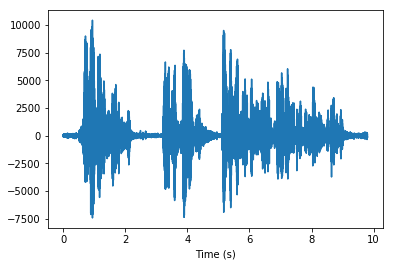

In [9]:
waves[0].plot()

/Users/Seong-EunCho/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:127: RuntimeWarning: divide by zero encountered in log


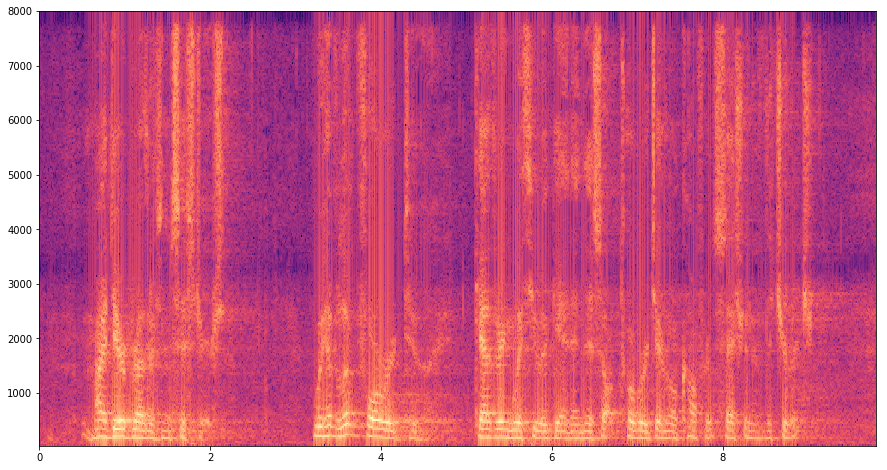

In [60]:
tf = 0.03
of = 0.01
spectrogram = waves[0].compute_spectrogram(time_frame=tf, overlap_frame=of)
d1, d2 = spectrogram.shape
N = int(rate * tf)
y = np.linspace(1, N, N)
y = y * rate / N
x = np.linspace(0, len(waves[0].samples)/rate, d1)
X, Y = np.meshgrid(x, y[:N//2])

fig = plt.figure()
plt.pcolormesh(X, Y, spectrogram.T, cmap="magma")
plt.show()

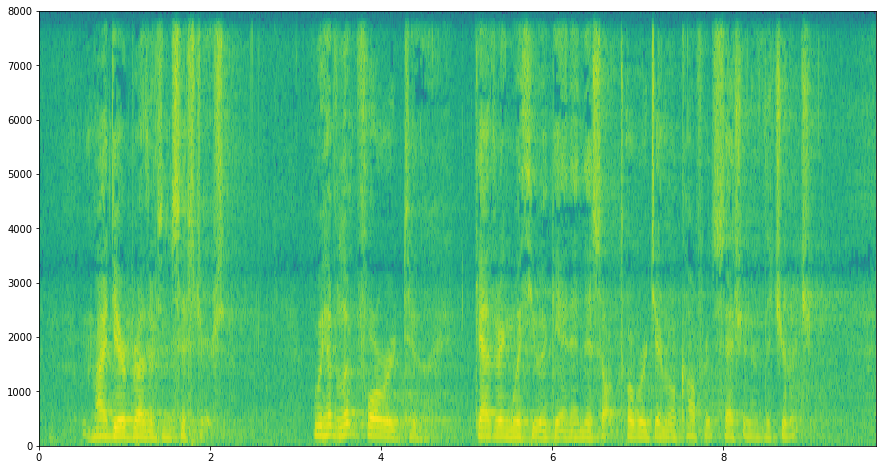

In [58]:
fig = plt.figure()
plt.specgram(waves[0].samples, Fs=rate)
plt.show()

/Users/Seong-EunCho/anaconda/lib/python3.6/site-packages/scipy/signal/signaltools.py:2223: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  Y[sl] = X[sl]
/Users/Seong-EunCho/anaconda/lib/python3.6/site-packages/scipy/signal/signaltools.py:2225: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  Y[sl] = X[sl]
/Users/Seong-EunCho/anaconda/lib/python3.6/site-packages/scipy/signal/signaltools.py:2230: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this 

<IPython.core.display.Javascript object>


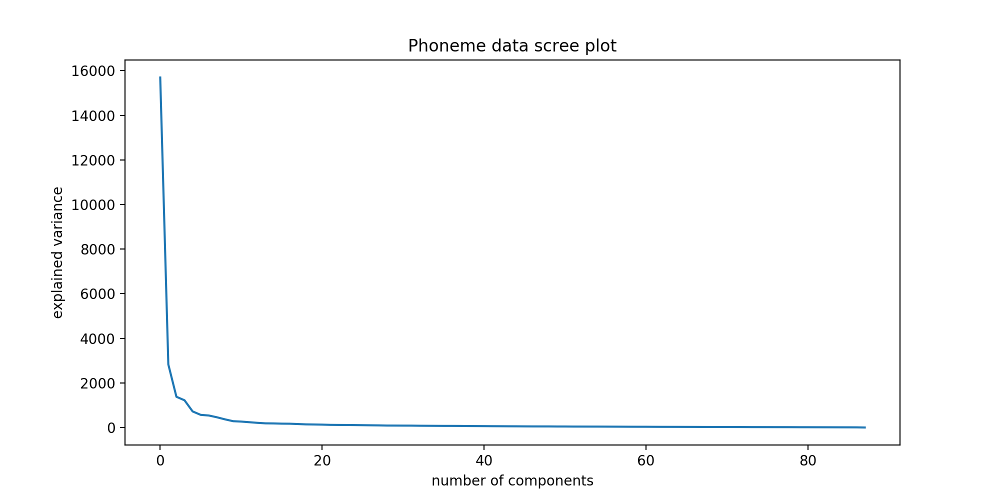

In [318]:
class PCA:
    def __init__(self, X, y=None, s=None):
        self.X = X - X.mean(axis=0)
        self.y = y
        if s == None:
            n, d = X.shape
            s = d
        U, sig, Vh = np.linalg.svd(self.X)
        self.sig = sig[:s]**2
        self.Vh = Vh[:s]
        self.a = self.transform(X)
        self.proj_X = self.project(X)
    
    def transform(self, x):
        return self.Vh@x.T
    
    def project(self, x):
        return self.Vh.T@self.a

def get_phoneme_data(phonemes=['f', 's', 'g', 't', 'p', 'schwa', 'ae', 'i', 'a']):
    phone_data = []
    phoneme_dict = {}
    for i, p in enumerate(phonemes):
        path = "ipa/"
        for f in os.listdir(path + p):
            fname = path + p + '/' + f
            rate, sample = wavfile.read(fname)
            n = len(sample)
            wave_spec = np.log(np.abs(sp.fft(sample))[:n//2])
            wave_spec = signal.resample(wave_spec, 240)
            phoneme_dict[i] = p
            phone_data.append(np.hstack([i, wave_spec]))

    phone_data = np.array(phone_data)
    X = phone_data[:, 1:]
    y = phone_data[:, 0]
    return X, y, phoneme_dict

X, y, phoneme_dict = get_phoneme_data()
pca = PCA(X)
n, d = X.shape

fig = plt.figure(figsize=(10, 5))
plt.plot(np.arange(n), pca.sig)
plt.xlabel("number of components")
plt.ylabel("explained variance")
plt.title("Phoneme data scree plot")
plt.show()

In [319]:
phoneme_dict[5] = 'ɘ'
phoneme_dict[6] = 'æ'
phoneme_dict

{0: 'f', 1: 's', 2: 'g', 3: 't', 4: 'p', 5: 'ɘ', 6: 'æ', 7: 'i', 8: 'a'}

In [320]:
i = 1
p = 0
while p < .9:
    p = np.sum(pca.sig[:i]) / np.sum(pca.sig)
    print(i, p)
    i+=1

1 0.538754181264368
2 0.6358609303666313
3 0.6831597513996036
4 0.7250567714451053
5 0.749808325444223
6 0.7692569295211142
7 0.7877292329089662
8 0.8034689829842363
9 0.8160053638203679
10 0.8257235544909826
11 0.8348326254143538
12 0.8429785869811668
13 0.8501533747336552
14 0.8565643370281263
15 0.8628386636643894
16 0.8687630699058628
17 0.8745794326711104
18 0.8799090021936452
19 0.8847333572951147
20 0.8893738638833039
21 0.8937846144472879
22 0.8978384176380207
23 0.9017727170029451


<IPython.core.display.Javascript object>


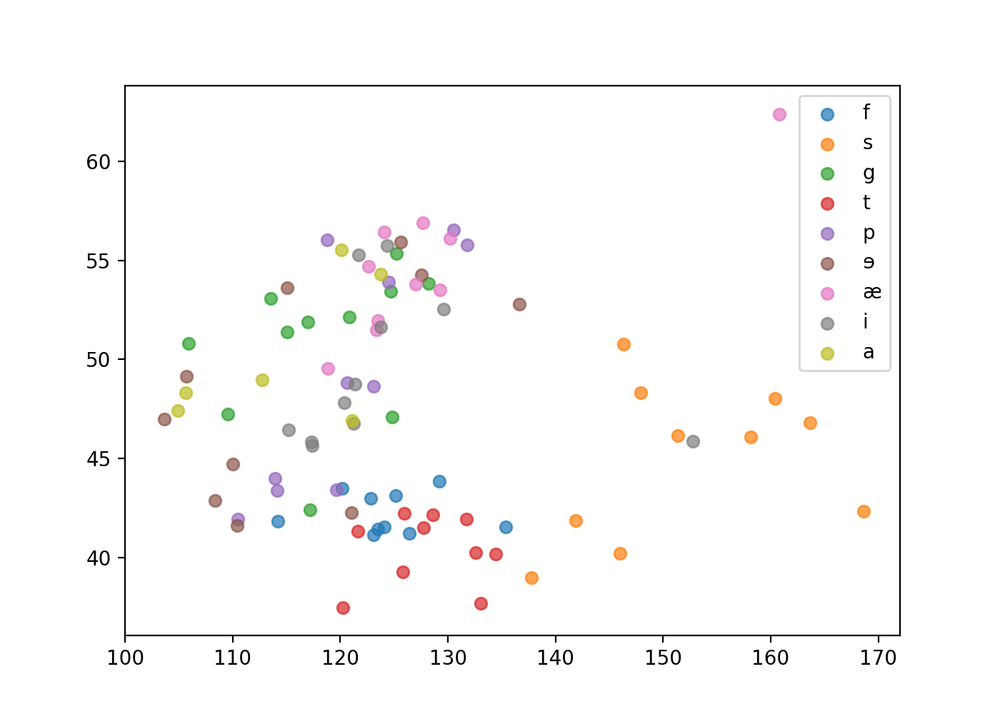

In [322]:
fig = plt.figure(figsize=(7, 5))
pca2 = PCA(X, y=y, s=2)
A = np.vstack([pca2.a, pca2.y])
for i in np.unique(y):
    curr_a = A.T[A[2] == i][:, :2]
    plt.scatter(curr_a[:, 0], curr_a[:, 1], label=phoneme_dict[i], alpha=0.7)
plt.legend(bbox_to_anchor=(1, 1))
plt.show()

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(7, 5))
pca3 = PCA(X, y=y, s=2)
A = np.vstack([pca2.a, pca2.y])
for i in np.unique(y):
    curr_a = A.T[A[2] == i][:, :2]
    plt.scatter(curr_a[:, 0], curr_a[:, 1], label=phoneme_dict[i], alpha=0.7)
plt.legend(bbox_to_anchor=(1, 1))
plt.show()

## Consonants

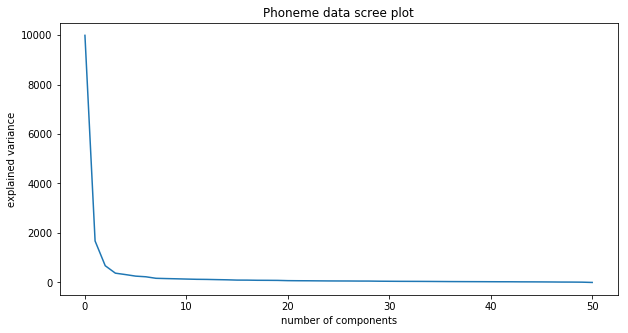

In [38]:
X_c = X[y < 5]
y_c = y[y < 5]
pca_c = PCA(X_c)
n, d = X_c.shape

fig = plt.figure(figsize=(10, 5))
plt.plot(np.arange(n), pca_c.sig)
plt.xlabel("number of components")
plt.ylabel("explained variance")
plt.title("Phoneme data scree plot")
plt.show()

In [39]:
i = 1
p = 0
while p < .9:
    p = np.sum(pca_c.sig[:i]) / np.sum(pca_c.sig)
    print(i, p)
    i+=1

1 0.6144162884185984
2 0.7175429163751417
3 0.7591059515983621
4 0.782183035251541
5 0.8017256691354525
6 0.8174346142524769
7 0.8315406106975979
8 0.8418521424986761
9 0.8514846062904164
10 0.8605483713474974
11 0.8689502099920517
12 0.8767643903886523
13 0.8843005459303702
14 0.8913102727003596
15 0.897865937744641
16 0.9037045449131751


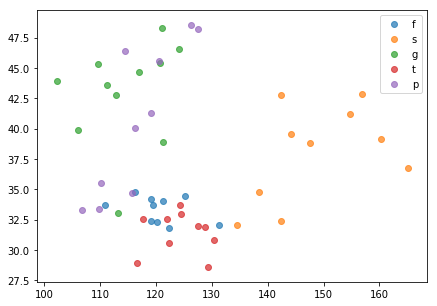

In [46]:
fig = plt.figure(figsize=(7, 5))
pca2_c = PCA(X_c, y=y_c, s=2)
A = np.vstack([pca2_c.a, pca2_c.y])
for i in np.unique(y_c):
    curr_a = A.T[A[2] == i][:, :2]
    plt.scatter(curr_a[:, 0], curr_a[:, 1], label=phoneme_dict[i], alpha=0.7)
plt.legend(bbox_to_anchor=(1, 1))
plt.show()

## Vowels

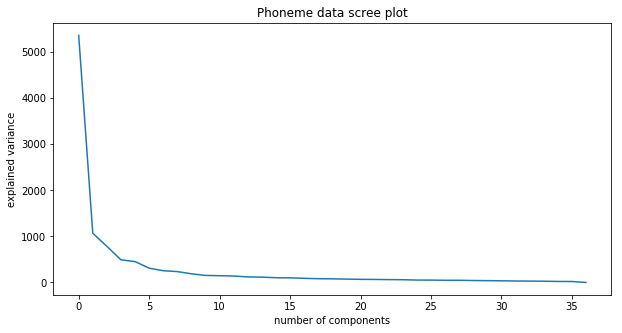

In [41]:
X_v = X[y >= 5]
y_v = y[y >= 5]
pca_v = PCA(X_v)
n, d = X_v.shape

fig = plt.figure(figsize=(10, 5))
plt.plot(np.arange(n), pca_v.sig)
plt.xlabel("number of components")
plt.ylabel("explained variance")
plt.title("Phoneme data scree plot")
plt.show()

In [42]:
i = 1
p = 0
while p < .9:
    p = np.sum(pca_v.sig[:i]) / np.sum(pca_v.sig)
    print(i, p)
    i+=1

1 0.48576659123191873
2 0.5825981030656254
3 0.6535658667748924
4 0.6980079491323417
5 0.7390175538661884
6 0.7671090341826133
7 0.7901968309148455
8 0.8115436221947957
9 0.8285359571334465
10 0.8423487694036742
11 0.8556206483004206
12 0.8682664934065719
13 0.8791070806769721
14 0.8895688682509689
15 0.8988398574638858
16 0.9078848450043218


<IPython.core.display.Javascript object>


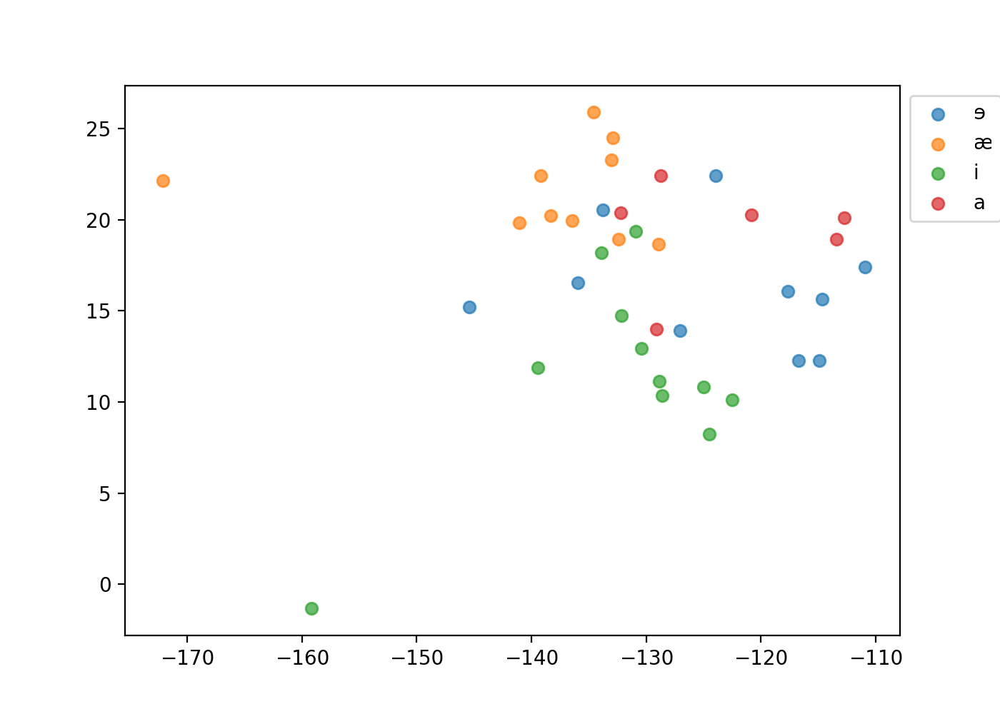

In [323]:
fig = plt.figure(figsize=(7, 5))
pca2_v = PCA(X_v, y=y_v, s=2)
A = np.vstack([pca2_v.a, pca2_v.y])
for i in np.unique(y_v):
    curr_a = A.T[A[2] == i][:, :2]
    plt.scatter(curr_a[:, 0], curr_a[:, 1], label=phoneme_dict[i], alpha=0.7)
plt.legend(bbox_to_anchor=(1, 1))
plt.show()

## Interpolation

In [298]:
def interpolation_data():
    path = "ipa/interpolate/audio"
    data = []
    for f in os.listdir(path):
        if f == ".DS_Store": continue
        fname = path + '/' + f
        rate, sample = wavfile.read(fname)
        n = len(sample)
        wave_spec = np.log(np.abs(sp.fft(sample))[:n//2])
        wave_spec = signal.resample(wave_spec, 240)
        data.append(wave_spec)
        
    return np.array(data)

interp = interpolation_data()

/Users/Seong-EunCho/anaconda/lib/python3.6/site-packages/scipy/signal/signaltools.py:2223: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  Y[sl] = X[sl]
/Users/Seong-EunCho/anaconda/lib/python3.6/site-packages/scipy/signal/signaltools.py:2225: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  Y[sl] = X[sl]
/Users/Seong-EunCho/anaconda/lib/python3.6/site-packages/scipy/signal/signaltools.py:2230: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this 

In [299]:
interp.shape

(1315, 240)

<IPython.core.display.Javascript object>


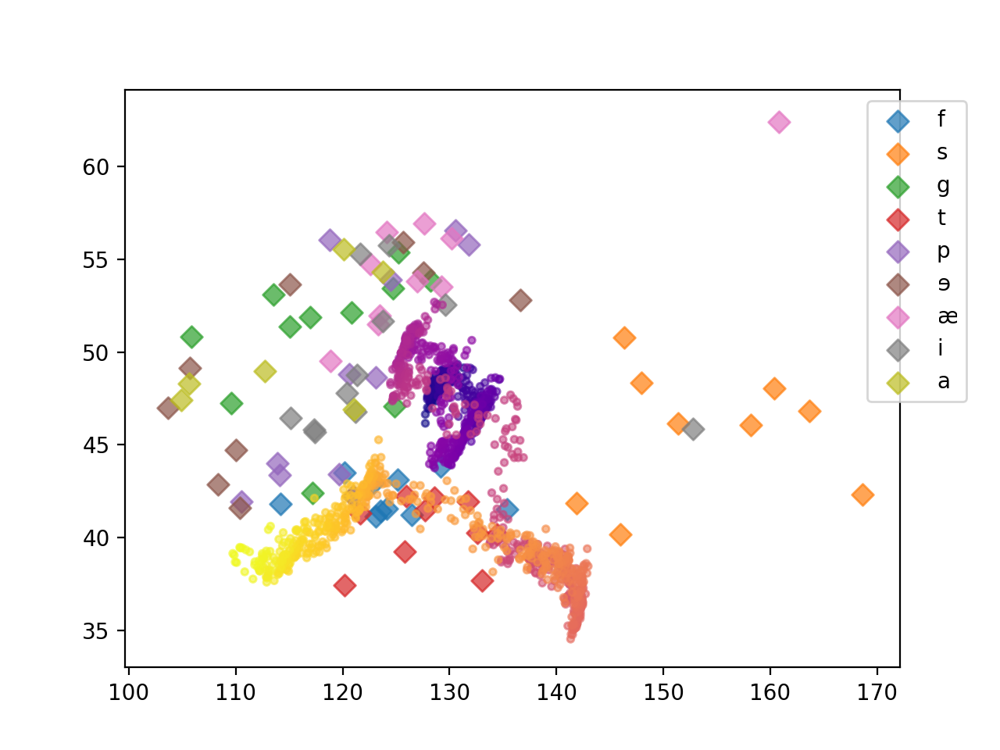

<IPython.core.display.Javascript object>


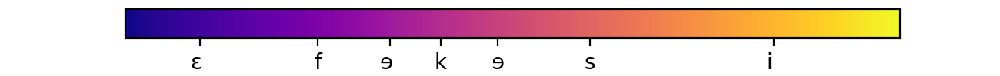

In [331]:
import matplotlib as mpl

A_ = pca2.transform(interp)
z = np.arange(A_.shape[1])
scaled_z = z / z.ptp()
fig = plt.figure()
cmap = plt.cm.plasma
colors = cmap(scaled_z)

A = np.vstack([pca2.a, pca2.y])

for i in np.unique(y):
    curr_a = A.T[A[2] == i][:, :2]
    plt.scatter(curr_a[:, 0], curr_a[:, 1], label=phoneme_dict[i], alpha=0.7, s=50, marker="D")
'''
for i in np.unique(y):
    curr_a = A.T[A[2] == i][:, :2]
    hull = sp.spatial.ConvexHull(curr_a)
    plt.fill(curr_a[hull.vertices, 0], curr_a[hull.vertices, 1], alpha=0.5, label=phoneme_dict[i])
'''
plt.legend(bbox_to_anchor=(1.1, 1))


plt.scatter(A_[0], A_[1], alpha=0.6, color=colors, s=10)
plt.show()

fig, ax = plt.subplots(figsize=(6.5, 0.5))
fig.subplots_adjust(bottom=0.5)
bounds = [9.7, 24.9, 34.2, 40.7, 48.1, 60, 83.7]
norm = mpl.colors.Normalize(vmin=0, vmax=100)
#norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
cb1 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,
                                norm=norm,
                                ticks=bounds,
                                orientation='horizontal')
cb1.ax.set_xticklabels(['ɛ ', 'f', 'ɘ ', 'k', 'ɘ', 's', 'i '])
plt.show()

<IPython.core.display.Javascript object>


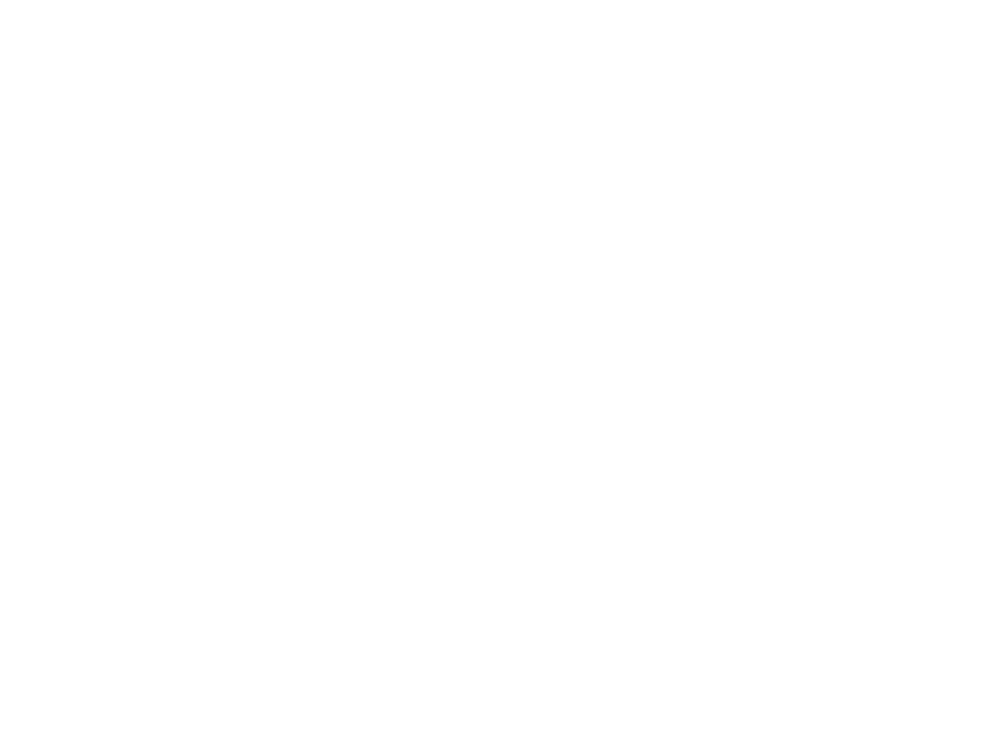

<IPython.core.display.Javascript object>


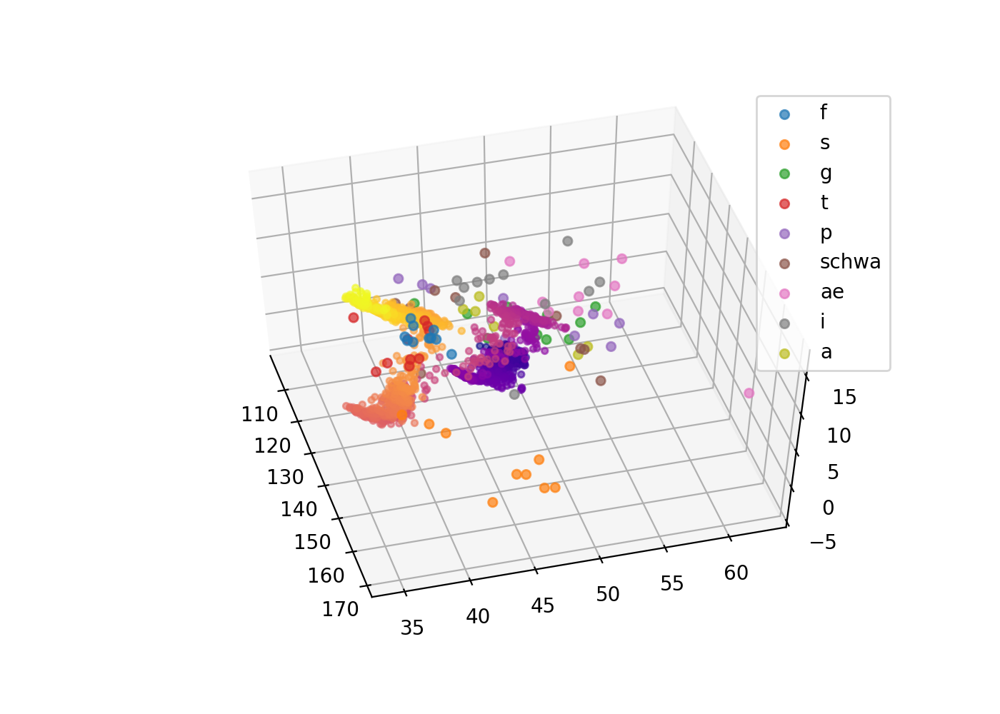

<IPython.core.display.Javascript object>


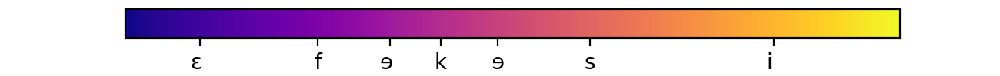

In [313]:
A_ = pca3.transform(interp)
z = np.arange(A_.shape[1])
scaled_z = z / z.ptp()
fig = plt.figure()
cmap = plt.cm.plasma
colors = cmap(scaled_z)

fig = plt.figure(figsize=(7, 5))
ax = fig.add_subplot(111, projection='3d')
pca3 = PCA(X, y=y, s=3)
A = np.vstack([pca3.a, pca3.y])
for i in np.unique(y):
    curr_a = A.T[A[3] == i][:, :3]
    ax.scatter(curr_a[:, 0], curr_a[:, 1], curr_a[:, 2], label=phoneme_dict[i], alpha=0.7)
plt.legend(bbox_to_anchor=(1, 1))

ax.scatter(A_[0], A_[1], A_[2], alpha=0.6, color=colors, s=10)
plt.show()

fig, ax = plt.subplots(figsize=(6.5, 0.5))
fig.subplots_adjust(bottom=0.5)
bounds = [9.7, 24.9, 34.2, 40.7, 48.1, 60, 83.7]
norm = mpl.colors.Normalize(vmin=0, vmax=100)
#norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
cb1 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,
                                norm=norm,
                                ticks=bounds,
                                orientation='horizontal')
cb1.ax.set_xticklabels(['ɛ ', 'f', 'ɘ ', 'k', 'ɘ', 's', 'i '])
plt.show()

In [165]:
np.arange(8)

array([0, 1, 2, 3, 4, 5, 6, 7])

In [107]:
colors

array([[0.2298057 , 0.29871797, 0.75368315, 1.        ],
       [0.2298057 , 0.29871797, 0.75368315, 1.        ],
       [0.2298057 , 0.29871797, 0.75368315, 1.        ],
       ...,
       [0.70567316, 0.01555616, 0.15023281, 1.        ],
       [0.70567316, 0.01555616, 0.15023281, 1.        ],
       [0.70567316, 0.01555616, 0.15023281, 1.        ]])

In [103]:
scaled_z

array([0.        , 0.00133156, 0.00266312, 0.00399467, 0.00532623,
       0.00665779, 0.00798935, 0.00932091, 0.01065246, 0.01198402,
       0.01331558, 0.01464714, 0.0159787 , 0.01731025, 0.01864181,
       0.01997337, 0.02130493, 0.02263648, 0.02396804, 0.0252996 ,
       0.02663116, 0.02796272, 0.02929427, 0.03062583, 0.03195739,
       0.03328895, 0.03462051, 0.03595206, 0.03728362, 0.03861518,
       0.03994674, 0.0412783 , 0.04260985, 0.04394141, 0.04527297,
       0.04660453, 0.04793609, 0.04926764, 0.0505992 , 0.05193076,
       0.05326232, 0.05459387, 0.05592543, 0.05725699, 0.05858855,
       0.05992011, 0.06125166, 0.06258322, 0.06391478, 0.06524634,
       0.0665779 , 0.06790945, 0.06924101, 0.07057257, 0.07190413,
       0.07323569, 0.07456724, 0.0758988 , 0.07723036, 0.07856192,
       0.07989348, 0.08122503, 0.08255659, 0.08388815, 0.08521971,
       0.08655126, 0.08788282, 0.08921438, 0.09054594, 0.0918775 ,
       0.09320905, 0.09454061, 0.09587217, 0.09720373, 0.09853

/Users/Seong-EunCho/anaconda/lib/python3.6/site-packages/matplotlib/figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


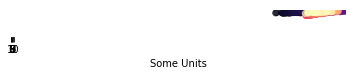

In [144]:
fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.5)
plt.scatter(A[0], A[1], alpha=0.6, color=colors)
cmap = mpl.cm.magma
norm = mpl.colors.Normalize(vmin=5, vmax=10)

cb1 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,
                                norm=norm,
                                orientation='horizontal')
cb1.set_label('Some Units')
fig.show()

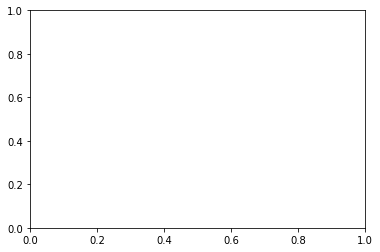

In [209]:
import numpy as np
import matplotlib
from matplotlib.patches import Circle, Wedge, Polygon
from matplotlib.collections import PatchCollection
import matplotlib.pyplot as plt

# Fixing random state for reproducibility
np.random.seed(19680801)


fig, ax = plt.subplots()

resolution = 50  # the number of vertices
N = 3
x = np.random.rand(N)
y = np.random.rand(N)
radii = 0.1*np.random.rand(N)
patches = []
for x1, y1, r in zip(x, y, radii):
    circle = Circle((x1, y1), r)
    patches.append(circle)

x = np.random.rand(N)
y = np.random.rand(N)
radii = 0.1*np.random.rand(N)
theta1 = 360.0*np.random.rand(N)
theta2 = 360.0*np.random.rand(N)
for x1, y1, r, t1, t2 in zip(x, y, radii, theta1, theta2):
    wedge = Wedge((x1, y1), r, t1, t2)
    patches.append(wedge)

# Some limiting conditions on Wedge
patches += [
    Wedge((.3, .7), .1, 0, 360),             # Full circle
    Wedge((.7, .8), .2, 0, 360, width=0.05),  # Full ring
    Wedge((.8, .3), .2, 0, 45),              # Full sector
    Wedge((.8, .3), .2, 45, 90, width=0.10),  # Ring sector
]

for i in range(N):
    polygon = Polygon(np.random.rand(N, 2), True)
    patches.append(polygon)

colors = 100*np.random.rand(len(patches))
p = PatchCollection(patches, alpha=0.4)
p.set_array(np.array(colors))
ax.add_collection(p)
fig.colorbar(p, ax=ax)

plt.show()

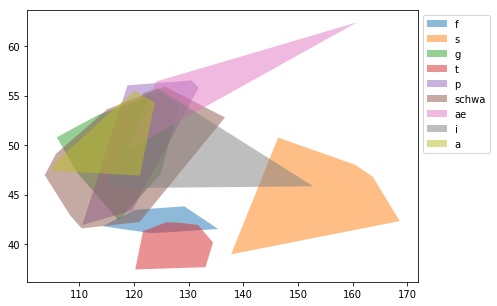

In [257]:
fig = plt.figure(figsize=(7, 5))
pca2 = PCA(X, y=y, s=2)
for i in np.unique(y):
    curr_a = A.T[A[2] == i][:, :2]
    hull = sp.spatial.ConvexHull(curr_a)
    plt.fill(curr_a[hull.vertices, 0], curr_a[hull.vertices, 1], alpha=0.5, label=phoneme_dict[i])

plt.legend(bbox_to_anchor=(1, 1))
plt.show()


In [241]:
hull = sp.spatial.ConvexHull(A[:-1].T)

In [242]:
hull.simplices

array([[61, 15],
       [43, 61],
       [56, 34],
       [39, 15],
       [39, 34],
       [22, 55],
       [22, 43],
       [60, 55],
       [60, 56]], dtype=int32)

[2.21375049e+05 7.39573801e+00 1.06141242e+00 8.11285891e-01
 6.80732868e-01 4.41862702e-01 3.29824005e-01 8.11795332e-02
 5.23069174e-02 3.62902332e-02 3.26722371e-02 2.35745971e-02
 1.57952247e-02 1.27171968e-02 1.23804216e-02 8.50178724e-03
 8.12298440e-03 6.91180730e-03 6.06795139e-03 4.86905886e-03
 4.57252152e-03 4.43586605e-03 3.89402822e-03 3.26456917e-03
 3.10411720e-03 2.90013186e-03 2.78145992e-03 2.63709843e-03
 2.32299759e-03 1.96006784e-03 1.87158559e-03 1.79228775e-03
 1.45619123e-03 1.34320434e-03 1.27228567e-03 1.16783916e-03
 1.05521731e-03 9.87789918e-04 9.74069649e-04 9.13797377e-04
 8.01644781e-04 7.75145823e-04 6.99676838e-04 6.60095625e-04
 6.37434241e-04 6.09751182e-04 5.43704141e-04 5.10843156e-04
 4.99540513e-04 4.41391346e-04 3.89701011e-04 3.68192198e-04
 3.37778441e-04 3.19701103e-04 3.04822406e-04 2.59653535e-04
 2.49879668e-04 2.44681780e-04 2.15837950e-04 1.98179447e-04
 1.88632013e-04 1.59101648e-04 1.51130079e-04 1.48539916e-04
 1.39460730e-04 1.224654

/Users/Seong-EunCho/anaconda/lib/python3.6/site-packages/scipy/signal/signaltools.py:2223: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  Y[sl] = X[sl]
/Users/Seong-EunCho/anaconda/lib/python3.6/site-packages/scipy/signal/signaltools.py:2225: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  Y[sl] = X[sl]
/Users/Seong-EunCho/anaconda/lib/python3.6/site-packages/scipy/signal/signaltools.py:2230: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this 

<IPython.core.display.Javascript object>


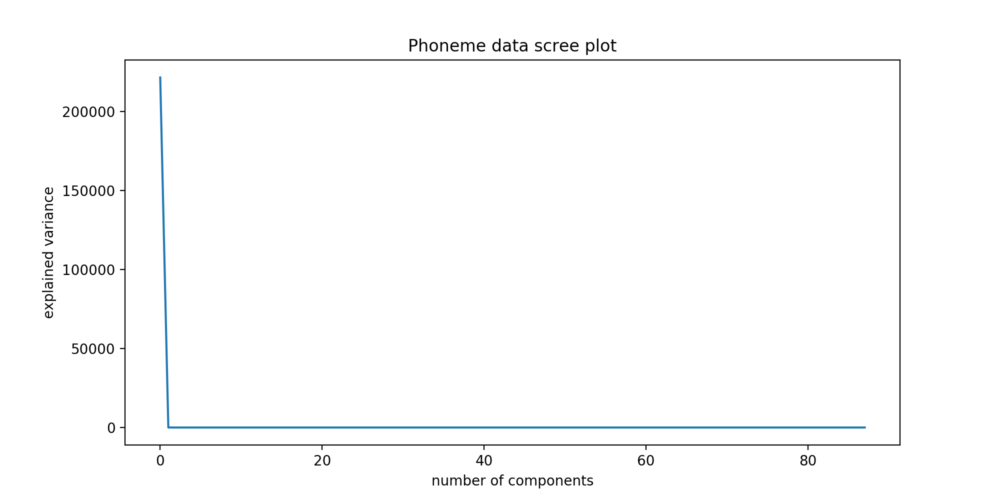

In [365]:
def get_phoneme_ceps(phonemes=['f', 's', 'g', 't', 'p', 'schwa', 'ae', 'i', 'a']):
    phone_data = []
    phoneme_dict = {}
    for i, p in enumerate(phonemes):
        path = "ipa/"
        for f in os.listdir(path + p):
            fname = path + p + '/' + f
            rate, sample = wavfile.read(fname)
            n = len(sample)
            wave_spec = np.log(np.abs(sp.fft(sample))**2)
            ceps = np.abs(sp.ifft(wave_spec))**2
            ceps = signal.resample(ceps, 480)
            phoneme_dict[i] = p
            phone_data.append(np.hstack([i, ceps]))

    phone_data = np.array(phone_data)
    X = phone_data[:, 1:]
    y = phone_data[:, 0]
    return X, y, phoneme_dict

X, y, phoneme_dict = get_phoneme_ceps()
pca = PCA(X)
n, d = X.shape
print(pca.sig)

fig = plt.figure(figsize=(10, 5))
plt.plot(np.arange(n), pca.sig)
plt.xlabel("number of components")
plt.ylabel("explained variance")
plt.title("Phoneme data scree plot")
plt.show()

In [364]:
i = 1
p = 0
while p < .9:
    p = np.sum(pca.sig[:i]) / np.sum(pca.sig)
    print(i, p)
    i+=1

1 0.9999499605346586


<IPython.core.display.Javascript object>


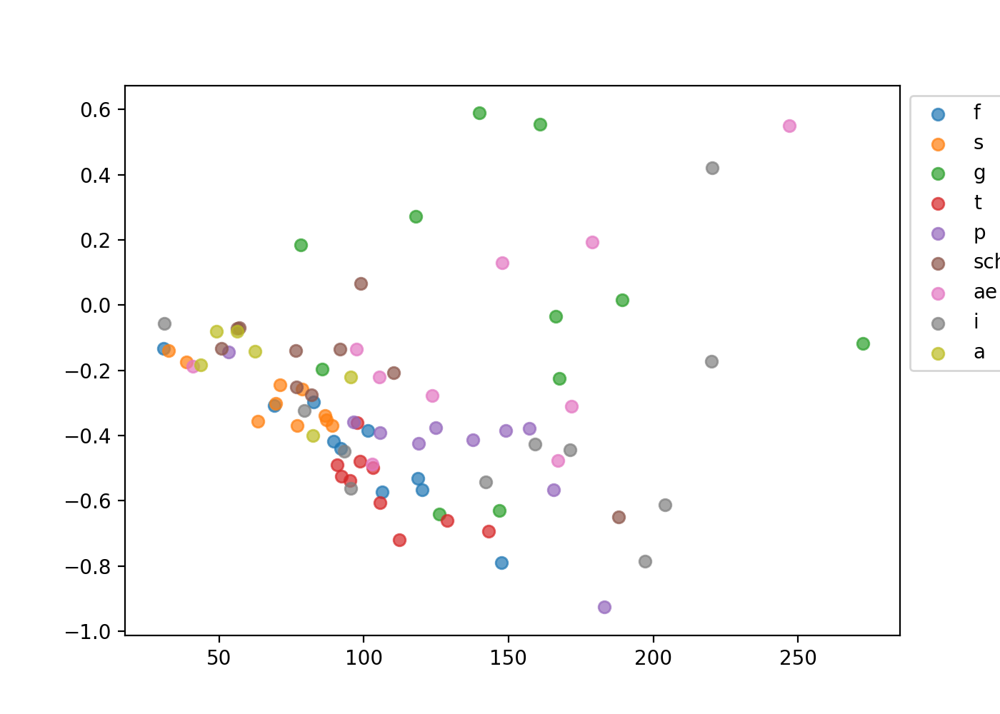

In [366]:
fig = plt.figure(figsize=(7, 5))
pca2 = PCA(X, y=y, s=2)
A = np.vstack([pca2.a, pca2.y])
for i in np.unique(y):
    curr_a = A.T[A[2] == i][:, :2]
    plt.scatter(curr_a[:, 0], curr_a[:, 1], label=phoneme_dict[i], alpha=0.7)
plt.legend(bbox_to_anchor=(1, 1))
plt.show()

<IPython.core.display.Javascript object>


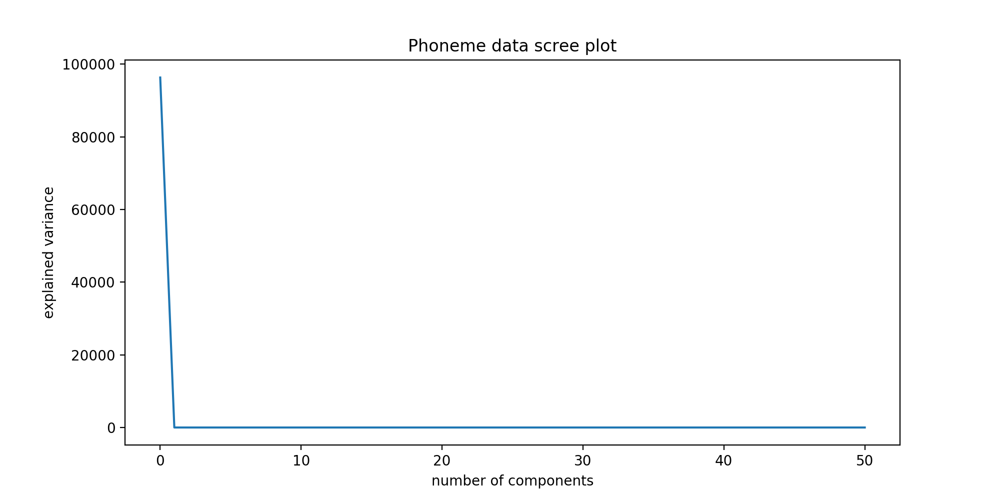

In [367]:
X_c = X[y < 5]
y_c = y[y < 5]
pca_c = PCA(X_c)
n, d = X_c.shape

fig = plt.figure(figsize=(10, 5))
plt.plot(np.arange(n), pca_c.sig)
plt.xlabel("number of components")
plt.ylabel("explained variance")
plt.title("Phoneme data scree plot")
plt.show()

<IPython.core.display.Javascript object>


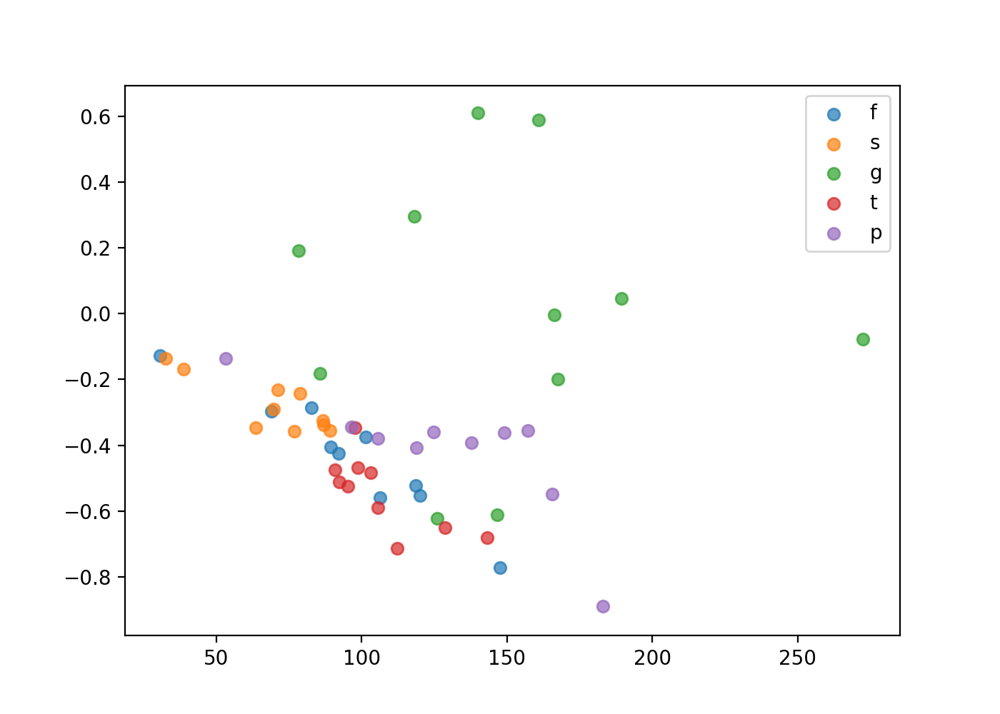

In [368]:
fig = plt.figure(figsize=(7, 5))
pca2_c = PCA(X_c, y=y_c, s=2)
A = np.vstack([pca2_c.a, pca2_c.y])
for i in np.unique(y_c):
    curr_a = A.T[A[2] == i][:, :2]
    plt.scatter(curr_a[:, 0], curr_a[:, 1], label=phoneme_dict[i], alpha=0.7)
plt.legend(bbox_to_anchor=(1, 1))
plt.show()

<IPython.core.display.Javascript object>


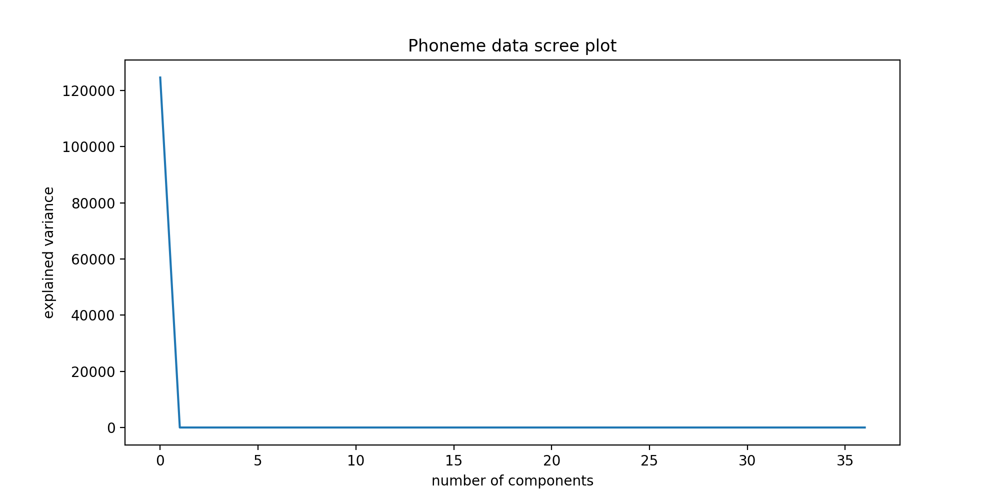

In [369]:
X_v = X[y >= 5]
y_v = y[y >= 5]
pca_v = PCA(X_v)
n, d = X_v.shape

fig = plt.figure(figsize=(10, 5))
plt.plot(np.arange(n), pca_v.sig)
plt.xlabel("number of components")
plt.ylabel("explained variance")
plt.title("Phoneme data scree plot")
plt.show()

<IPython.core.display.Javascript object>


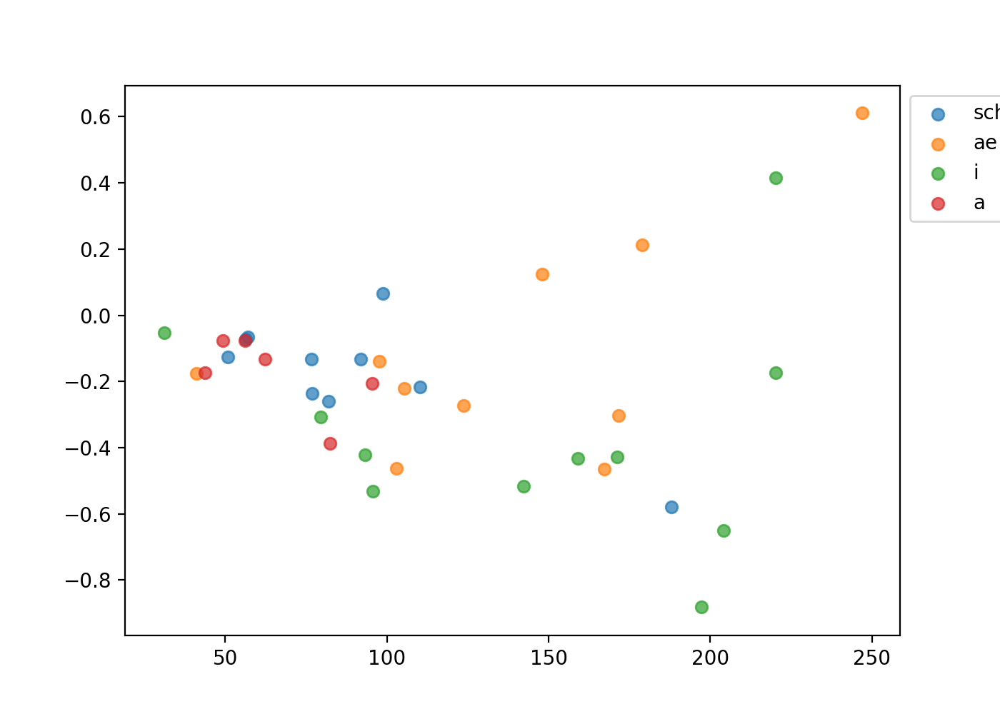

In [370]:
fig = plt.figure(figsize=(7, 5))
pca2_v = PCA(X_v, y=y_v, s=2)
A = np.vstack([pca2_v.a, pca2_v.y])
for i in np.unique(y_v):
    curr_a = A.T[A[2] == i][:, :2]
    plt.scatter(curr_a[:, 0], curr_a[:, 1], label=phoneme_dict[i], alpha=0.7)
plt.legend(bbox_to_anchor=(1, 1))
plt.show()

In [371]:
import matplotlib as mpl

A_ = pca2.transform(interp)
z = np.arange(A_.shape[1])
scaled_z = z / z.ptp()
fig = plt.figure()
cmap = plt.cm.plasma
colors = cmap(scaled_z)

A = np.vstack([pca2.a, pca2.y])

for i in np.unique(y):
    curr_a = A.T[A[2] == i][:, :2]
    plt.scatter(curr_a[:, 0], curr_a[:, 1], label=phoneme_dict[i], alpha=0.7, s=50, marker="D")
'''
for i in np.unique(y):
    curr_a = A.T[A[2] == i][:, :2]
    hull = sp.spatial.ConvexHull(curr_a)
    plt.fill(curr_a[hull.vertices, 0], curr_a[hull.vertices, 1], alpha=0.5, label=phoneme_dict[i])
'''
plt.legend(bbox_to_anchor=(1.1, 1))


plt.scatter(A_[0], A_[1], alpha=0.6, color=colors, s=10)
plt.show()

fig, ax = plt.subplots(figsize=(6.5, 0.5))
fig.subplots_adjust(bottom=0.5)
bounds = [9.7, 24.9, 34.2, 40.7, 48.1, 60, 83.7]
norm = mpl.colors.Normalize(vmin=0, vmax=100)
#norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
cb1 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,
                                norm=norm,
                                ticks=bounds,
                                orientation='horizontal')
cb1.ax.set_xticklabels(['ɛ ', 'f', 'ɘ ', 'k', 'ɘ', 's', 'i '])
plt.show()

ValueError: shapes (2,480) and (240,1315) not aligned: 480 (dim 1) != 240 (dim 0)